In [1]:
using Pkg
Pkg.activate("/home/ajaeger/Documents/githubrepos/Stage/Script/MyProject") #activation of the correct environment for the notebook
using Agents, Distributions, DataFrames, DifferentialEquations, Plots, GLM, LinearRegression

  Activating project at `~/Documents/githubrepos/Stage/Script/MyProject`


In [20]:
Base.@kwdef mutable struct NicheParameters
    s::Int = 0
    cell_created::Vector = [] #everytime a cell divide we count that one cell is created 
    cell_differentiated::Vector = [] #everytime a cell differentiate we count + 1 
    stem_cell_number::Vector = []
    activation_parameters::Tuple = (log(2)/(1/110), 10) #this is accurate 
    K::Int = 17000 #Carrying capacity
    division_parameters::Tuple = (log(2)/(1/110), 10) #1/110 is the stem cell proliferation rate
end

NicheParameters

In [3]:
@agent StemCell NoSpaceAgent begin
    type::Int
    division_time::Float64
    activation_time::Float64
    label::Bool
end

In [4]:
function division_time_draw(model::ABM, n::Int)
    return rand(Normal(model.division_parameters[1], model.division_parameters[2]), n)
end

division_time_draw (generic function with 1 method)

In [5]:
function division!(cell::StemCell,model::ABM)
    next_division_time = division_time_draw(model, 2)
    next_transition_time = differentiation_time_draw(model, 2)
    add_agent!(StemCell, model, 0, next_division_time[1] + model.s, next_transition_time[1] + model.s, cell.label)
    add_agent!(StemCell, model, 0, next_division_time[2] + model.s, next_transition_time[2] + model.s, cell.label)
    remove_agent!(cell, model)
    model.cell_created[model.s] += 1
    return nothing
end

division! (generic function with 1 method)

In [6]:
function differentiation_time_draw(model::ABM, n::Int)
    return rand(Normal(model.activation_parameters[1], model.activation_parameters[2]), n)
end

differentiation_time_draw (generic function with 1 method)

In [7]:
function differentiation!(cell::StemCell, model::ABM)
    cell.type = 1
    cell.activation_time = 0
    model.cell_differentiated[model.s] += 1
    return nothing
end

differentiation! (generic function with 1 method)

In [8]:
#Scheduler which selects all cell of type 0 
function ms(model::ABM)
    ids = collect(allids(model))
        # filter all ids whose agents have `w` less than some amount
    filter!(id -> model[id].type == 0, ids)
    
    print(ids)
    return ids
end

ms (generic function with 1 method)

In [9]:
function agent_step!(cell::StemCell, model::ABM)
    # this steps only occurs for cells of type = 0 else nothings happen
    if (floor(cell.activation_time) == model.s) & (cell.activation_time < cell.division_time)
            differentiation!(cell, model)
    elseif (floor(cell.division_time) == model.s) & (cell.activation_time > cell.division_time)
            division!(cell, model)
    end
    return nothing
end

agent_step! (generic function with 1 method)

In [10]:
function model_step!(model::ABM)
    if model.s == 42
        labelling(model, 0.01, 0)
    end
    ids = collect(allids(model))
    filter!(id -> model[id].type == 0, ids)
    model.stem_cell_number[model.s] = length(ids)
    model.s += 1
end 

model_step! (generic function with 1 method)

In [11]:
function initialize_model!(n_stem_cells::Int, division_parameters::Tuple, activation_parameters::Tuple, nbr_steps::Int, ms)
    space = nothing
    modelparameters_0 = NicheParameters(s = 1, stem_cell_number = [0 for _ in 1:nbr_steps], activation_parameters = activation_parameters, division_parameters = division_parameters, cell_created = [0 for _ in 1:nbr_steps], cell_differentiated = [0 for _ in 1:nbr_steps])
    niche = StandardABM(StemCell, space; properties = modelparameters_0, scheduler = ms)

    division_times = division_time_draw(niche, n_stem_cells).*rand(n_stem_cells)
    activation_times = differentiation_time_draw(niche, n_stem_cells).*rand(n_stem_cells)
    
    for i in 1:n_stem_cells
        add_agent!(StemCell, niche, 0, division_times[i], activation_times[i], false)
    end
    return niche
end

initialize_model! (generic function with 1 method)

In [12]:
function labelling(model::ABM, frequency::Float64, type::Int)
    ids = collect(allids(model))
    filter!(id -> model[id].type == type, ids)
    print(ids)
    labeled_cells = rand(ids, Int(floor(frequency*length(ids))))
    for i in labeled_cells
        model[i].label = true 
    end
    return labeled_cells
end

labelling (generic function with 1 method)

In [21]:
niche = initialize_model!(17000, (350.0, 6.0), (653.59, 6.0), 100, ms)


StandardABM with 17000 agents of type StemCell
 space: nothing (no spatial structure)
 scheduler: ms
 properties: s, cell_created, cell_differentiated, stem_cell_number, activation_parameters, K, division_parameters

In [22]:
mean(division_time_draw(niche, 1000).*rand(1000))


176.42181005738632

In [23]:
type0(a) = a.type==0
type1(a) = a.type==1
labeled1(a) = (a.label==true && a.type==1)
labeled0(a) = (a.label==true && a.type==0)

labeled0 (generic function with 1 method)

In [24]:
niche = initialize_model!(17000, (350.0, 6.0), (350.0, 6.0), 800, ms)
data = run!(niche, agent_step!, model_step!, 800; adata = [(labeled1, sum), (labeled0, sum), (type0, sum), (type1, sum)])

[11950, 1703, 12427, 7685, 3406, 1090, 2015, 11280, 16805, 3220, 11251, 422, 15370, 15859, 4030, 8060, 14167, 8660, 14221, 15545, 3855, 3163, 9523, 15916, 16341, 2989, 4357, 12797, 8552, 14085, 9266, 10454, 844, 4738, 59, 1171, 14544, 366, 9329, 9152, 1102, 79, 11025, 6803, 14159, 2920, 7654, 14430, 7438, 2783, 6819, 5858, 7710, 11925, 732, 14639, 11775, 8714, 16361, 7560, 14398, 1896, 11110, 16451, 13271, 5978, 7292, 8918, 1526, 6816, 436, 11845, 15231, 4951, 11869, 3044, 1374, 9558, 15878, 13915, 9318, 15135, 10261, 3089, 2204, 12178, 14876, 5401, 12346, 12703, 4051, 12635, 13950, 7886, 145, 15308, 8915, 11910, 5840, 10279, 8298, 5566, 7315, 15420, 158, 15120, 14774, 11714, 13159, 3140, 13556, 1147, 6576, 13051, 16868, 1274, 10408, 9345, 3792, 6543, 5587, 11646, 10839, 3052, 16982, 6418, 10774, 6696, 4923, 412, 3877, 6001, 15036, 13410, 2748, 8495, 6235, 10895, 4643, 3092, 9902, 4105, 5279, 13755, 15235, 15650, 4726, 6812, 9938, 5550, 795, 14819, 5321, 8476, 7647, 908, 6270, 6764, 13

Excessive output truncated after 524289 bytes.

 11951, 4251, 5326, 12863, 13135, 323, 9036, 8012, 12648, 2647, 201, 5215, 17281, 1949, 5665, 9627, 869, 8880, 3414, 14992, 3993, 695, 3674, 1801, 5944, 16615, 12009, 11262, 12819, 4099, 15257, 6863, 16906, 5524, 1410, 10671, 8444, 17187, 4540, 5199, 14504, 7537, 13546, 10506, 13020, 13457, 9984, 5134, 12609, 5884, 11644, 12805, 14358, 7356, 10757, 15881, 7130, 4543, 10502, 7273, 10858, 16953, 6345, 8263, 9639, 4497, 8084, 9476, 9014, 9671, 8971, 2037, 8281, 2352, 8366, 9186, 12196, 7944, 15706, 16311, 12390, 10168, 13311, 7604, 11405, 7805, 12554, 10854, 3473, 11600, 12076, 1199, 2291, 5184, 3006, 9970, 17296, 14017, 7766, 7400, 17295, 5386, 12766, 14671, 5062, 3794, 17188, 1285, 14882, 172, 2141, 4748, 6151, 9507, 1625, 8891, 3765, 10360, 11725, 1745, 4855, 4077, 8418, 1859, 11522, 5689, 4024, 14457, 5853, 2732, 3754, 9890, 14755, 9221, 2063, 4372, 13560, 15627, 11550, 1922, 7983, 13521, 9404, 1724, 9356, 6703, 15003, 12340, 3441, 13937, 12305, 6758, 16047, 1095, 2372, 3364, 13112, 1

(801×5 DataFrame
 Row │ step   sum_labeled1  sum_labeled0  sum_type0  sum_type1 
     │ Int64  Int64         Int64         Int64      Int64     
─────┼─────────────────────────────────────────────────────────
   1 │     0             0             0      17000          0
   2 │     1             0             0      17006         48
   3 │     2             0             0      17005         93
   4 │     3             0             0      17011        139
   5 │     4             0             0      16996        196
   6 │     5             0             0      17002        235
   7 │     6             0             0      17000        282
   8 │     7             0             0      16998        324
  ⋮  │   ⋮         ⋮             ⋮            ⋮          ⋮
 795 │   794           203           130      17139      20934
 796 │   795           203           131      17144      20966
 797 │   796           203           131      17141      21000
 798 │   797           205           12

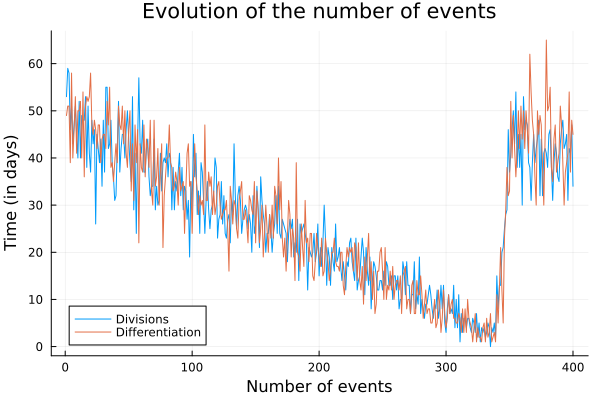

In [153]:
plot(1:400, niche.cell_created[1:400], title ="Evolution of the number of events", label= "Divisions", xlabel ="Time (in days)", ylabel= "Number of events")
plot!(1:400, niche.cell_differentiated[1:400], label ="Differentiations")


In [158]:
lr = linregress(1:350, niche.cell_created[1:350])

LinearRegression.LinearRegressor{Vector{Float64}}(true, [-0.12040471467405575, 45.773884568153925])

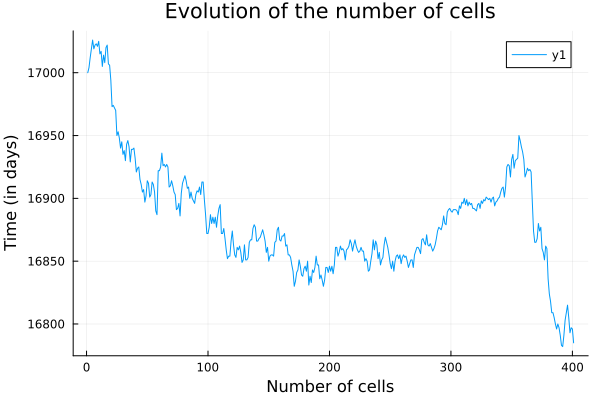

In [154]:
plot(1:401, data[1][!, :sum_type0], title ="Evolution of the number of cells", xlabel = "Number of cells", ylabel = "Time (in days)")

In [168]:
niche2 = initialize_model!(17000, (350.0, 6.0), (350.0, 6.0), 5000, ms)
data2 = run!(niche2, agent_step!, model_step!, 5000; adata = [(labeled1, sum), (labeled0, sum), (type0, sum), (type1, sum)])

(5001×5 DataFrame
  Row │ step   sum_labeled1  sum_labeled0  sum_type0  sum_type1 
      │ Int64  Int64         Int64         Int64      Int64     
──────┼─────────────────────────────────────────────────────────
    1 │     0             0             0      17000          0
    2 │     1             0             0      17013         51
    3 │     2             0             0      17019         95
    4 │     3             0             0      17010        146
    5 │     4             0             0      17002        199
    6 │     5             0             0      16991        255
    7 │     6             0             0      16984        305
    8 │     7             0             0      16982        354
  ⋮   │   ⋮         ⋮             ⋮            ⋮          ⋮
 4995 │  4994             0             0      18037     128006
 4996 │  4995             0             0      18035     128031
 4997 │  4996             0             0      18039     128064
 4998 │  4997          

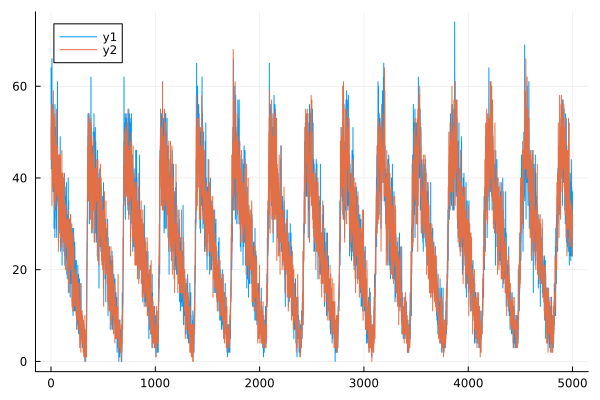

In [172]:
plot(1:5000, niche2.cell_created)
plot!(1:5000, niche2.cell_differentiated)

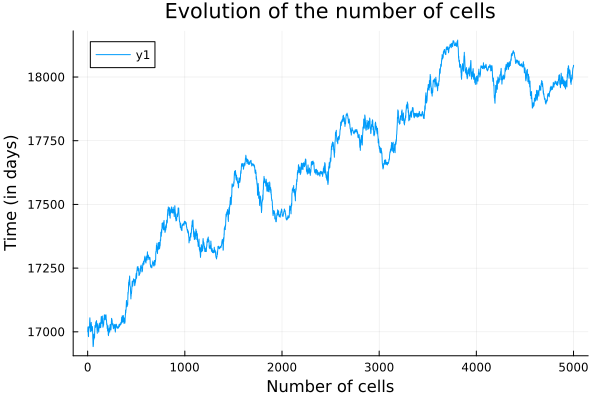

In [169]:
plot(1:5001, data2[1][!, :sum_type0], title ="Evolution of the number of cells", xlabel = "Number of cells", ylabel = "Time (in days)")

With this degree of complexity and for this parameters it seems impossible to have cells labelled which differentiates to over states only after several weeks. We make the assumption like in the model which inspired M3 that there is an activated and unactivated state of the stem cells, a stage where they can reenter the niche and stay stem or leave definitly the niche and become something else. 
2 compartments in the HSC. (which papers would support such an hypothesis)

In [3]:
Base.@kwdef mutable struct LayersNicheParameters
    s::Int = 0
    cell_created::Vector = [] #everytime a cell divide we count that one cell is created 
    cell_differentiated::Vector = [] #everytime a cell differentiate we count + 1 
    stem_cell_number::Vector = [[], [], []] #at index 1 is the number of quiescent stem cell and at index 2 the number of cycling stem cell
    activation_parameters::Vector{Tuple} = [(log(2)/(1/110), 10), (log(2)/(1/110), 10)] #at index 1 is the time of activation of quiescent stem cell and at index 2 the time of differentiation of cycling stem cell
    quiescence_parameters::Vector{Tuple} = [(log(2)/(1/110), 10)] #time of cycling cell becoming quiescent again
    K::Int = 17000 #Carrying capacity
    division_parameters::Vector{Tuple} = [(log(2)/(1/110), 10)] #1/110 is the stem cell proliferation rate
end

LayersNicheParameters

In [4]:
@agent ActivableStemCell NoSpaceAgent begin
    type::Int #quiescent stem cell are type 0 and cycling are type 1
    division_time::Float64
    activation_time::Float64
    quiescence_time::Float64
    differentiation_time::Float64
    label::Bool
    next_event_time::Float64
    next_event_type::String #Differentiation, Division, Activation, Quiescence
end

In [5]:
function activation!(model::ABM, cell::ActivableStemCell)

    cell.type = 1
    cell.activation_time = 0.0
    
    quiescence_differentiation!(model, cell, cell.next_event_time)

    if (cell.division_time < model.s) | (cell.quiescence_time < model.s) | (cell.differentiation_time < model.s)
        print("\n Y a un probleme dans l'attribution des temps \n")
        print("On est au temps : ", model.s)
        print("\n l'évenement se deroule au temps : ", cell.next_event_time)
        print("Division time = ", cell.division_time, " Quiescence_time = ", cell.quiescence_time, " differentiation time = ", cell.differentiation_time)
    end

    if cell.next_event_time < model.s + 1
        agent_step!(cell, model)
    end
    
    return nothing
end

activation! (generic function with 1 method)

In [6]:
function quiescence_differentiation!(model::ABM, cell::ActivableStemCell, event_time::Float64)
    cell.quiescence_time = draw_quiescence_time(model, 1)[1] + event_time
    cell.differentiation_time = draw_differentiation_time(model, 1)[1] + event_time
    cell.division_time = draw_division_time(model, 1)[1] + event_time

    if (cell.quiescence_time < cell.differentiation_time) & (cell.quiescence_time < cell.division_time)
        cell.next_event_time = cell.quiescence_time
        cell.next_event_type = "Quiescence"

    elseif (cell.differentiation_time < cell.quiescence_time) & (cell.differentiation_time < cell.division_time)
        cell.next_event_time = cell.differentiation_time
        cell.next_event_type = "Differentiation"
    
    elseif (cell.division_time < cell.quiescence_time) & (cell.division_time < cell.differentiation_time)
        cell.next_event_time = cell.division_time
        cell.next_event_type = "Division"

    end
    
    return nothing
end

quiescence_differentiation! (generic function with 1 method)

In [7]:
function differentiation!(model::ABM, cell::ActivableStemCell)
    model.cell_differentiated[model.s] += 1

    cell.type = 2
    
    cell.quiescence_time = 0.0
    cell.differentiation_time = 0.0
    cell.activation_time = 0.0
    cell.division_time = 0.0

    cell.next_event_time = 0.0
    cell.next_event_type = "None"
    return nothing
end

differentiation! (generic function with 1 method)

In [8]:
function quiescence!(model::ABM, cell::ActivableStemCell)
 
    cell.type = 0

    cell.quiescence_time = 0.0
    cell.differentiation_time = 0.0
    cell.division_time = 0.0

    cell.activation_time = draw_activation_time(model, 1)[1] + cell.next_event_time
    cell.next_event_time = cell.activation_time
    cell.next_event_type = "Activation"

    if cell.next_event_time < model.s + 1
        agent_step!(cell, model)
    end
    
    return nothing
end

quiescence! (generic function with 1 method)

In [9]:
function division!(model::ABM, cell::ActivableStemCell)
    next_division_time = draw_division_time(model, 2)
    model.cell_created[model.s] += 1
    model.stem_cell_number[2][model.s] += 1
    daughters_id = [0, 0]

    for i in 1:2  
        if (cell.quiescence_time < cell.differentiation_time) & (cell.quiescence_time < next_division_time[i] + cell.next_event_time)
            daughters_id[i] = nextid(model)
            daughter = ActivableStemCell(daughters_id[i], 1, next_division_time[i] + cell.next_event_time, cell.activation_time, cell.quiescence_time, cell.differentiation_time, cell.label, cell.quiescence_time, "Quiescence")
            add_agent!(daughter, model)

        elseif (cell.differentiation_time < cell.quiescence_time) & (cell.differentiation_time < next_division_time[i] + cell.next_event_time)
            daughters_id[i] = nextid(model)
            daughter = ActivableStemCell(daughters_id[i], 1, next_division_time[i] + cell.next_event_time, cell.activation_time, cell.quiescence_time, cell.differentiation_time, cell.label, cell.differentiation_time, "Differentiation")
            add_agent!(daughter, model)
        
        elseif (next_division_time[i] + cell.next_event_time < cell.quiescence_time) & (next_division_time[i] + cell.next_event_time < cell.differentiation_time)
            daughters_id[i] = nextid(model)
            daughter = ActivableStemCell(daughters_id[i], 1, next_division_time[i] + cell.next_event_time, cell.activation_time, cell.quiescence_time, cell.differentiation_time, cell.label, next_division_time[i] + cell.next_event_time, "Division")
            add_agent!(daughter, model)
        end

        if model[daughters_id[i]].next_event_time < model.s + 1
            agent_step!(model[daughters_id[i]], model)
        end
    end
    remove_agent!(cell, model)
    
    return nothing
end

division! (generic function with 1 method)

In [10]:
function draw_quiescence_time(model::ABM, n::Int)
    numbers = rand(Normal(model.quiescence_parameters[1][1],model.quiescence_parameters[1][2]), n)
    for i in 1:n
        if numbers[i] < 0
            numbers[i] = -numbers[i]
        end
    end
    return numbers
end

function draw_activation_time(model::ABM, n::Int)
    numbers = rand(Normal(model.activation_parameters[1][1], model.activation_parameters[1][2]), n)
    for i in 1:n
        if numbers[i] < 0
            numbers[i] = -numbers[i]
        end
    end
    return numbers
end

function draw_differentiation_time(model::ABM, n::Int)
    numbers = rand(Normal(model.activation_parameters[2][1], model.activation_parameters[2][2]), n)
    for i in 1:n
        if numbers[i] < 0
            numbers[i] = -numbers[i]
        end
    end
    return numbers
end

function draw_division_time(model::ABM, n::Int)
    numbers =  rand(Normal(model.division_parameters[1][1], model.division_parameters[1][2]), n)
    for i in 1:n
        if numbers[i] < 0
            numbers[i] = -numbers[i]
        end
    end
    return numbers
end

draw_division_time (generic function with 1 method)

In [11]:
function agent_step!(cell::ActivableStemCell, model::ABM)
    if cell.next_event_type == "Quiescence"
        quiescence!(model, cell)
        #print("Quiescence")
    
    elseif cell.next_event_type == "Activation"
        activation!(model, cell)
    
    elseif cell.next_event_type == "Differentiation"
        differentiation!(model, cell)
    
    elseif cell.next_event_type == "Division"
        division!(model, cell)
    end
    
    return nothing
end

agent_step! (generic function with 1 method)

In [19]:
function model_step!(model::ABM)
    if model.s == 42
        labelling(model, 0.01, 0)
    end
    ids = collect(allids(model))
    model.stem_cell_number[1][model.s] = length(filter(id -> isequal(model[id].type, 0), ids))
    model.stem_cell_number[2][model.s] = length(filter(id -> isequal(model[id].type, 1), ids))
    #model.stem_cell_number[3][model.s] = length(filter(id -> isequal(model[id].type, 2), ids))
    model.s += 1
end 

model_step! (generic function with 1 method)

In [13]:
function ms(model::ABM)

    ids = collect(allids(model))
        # filter all ids whose agents have `w` less than some amount
    filter!(id -> floor(model[id].next_event_time) == model.s, ids)
    return ids
end

ms (generic function with 1 method)

In [14]:
function custom_collect_stem_agent_data!(model::ABM, properties::Vector)
    dd = DataFrame()
    alla = collect(allagents(model))
    filter!(ag -> ag.type == 2, alla)
    dd[!, :step] = map(a -> model.s, alla)
    for fn in properties[2:length(properties)]
        # Extract data for each property using getfield
        dd[!, fn] = getfield.(alla, fn)
    end
    return dd
end


function custom_stem_run!(model::ABM, agent_step!::Function, model_step!::Function, n_steps::Int, properties::Vector)

    df = DataFrame()
    for i in 1:n_steps
        step!(model, agent_step!, model_step!, 1)
        dd = custom_collect_stem_agent_data!(model, properties)
        df = vcat(df, dd)
    end
    return df
end

custom_stem_run! (generic function with 1 method)

In [15]:
function initialize_layersnichemodel!(n_stem_cells::Int, division_parameters::Vector, activation_parameters::Vector, quiescence_parameters::Vector, nbr_steps::Int, ms)
    space = nothing
    modelparameters_0 = LayersNicheParameters(s = 1, stem_cell_number = [[0 for _ in 1:nbr_steps], [0 for _ in 1:nbr_steps]], activation_parameters = activation_parameters, division_parameters = division_parameters, quiescence_parameters = quiescence_parameters, cell_created = [0 for _ in 1:nbr_steps], cell_differentiated = [0 for _ in 1:nbr_steps])
    niche = StandardABM(ActivableStemCell, space; properties = modelparameters_0, scheduler = ms)
    activation_times = draw_activation_time(niche, n_stem_cells) .* rand(n_stem_cells)
    
    for i in 1:n_stem_cells
        add_agent!(ActivableStemCell, niche, 0, 0.0, activation_times[i], 0.0, 0.0, false, activation_times[i], "Activation")
    end
    
    return niche
end

initialize_layersnichemodel! (generic function with 1 method)

In [16]:
function labelling(model::ABM, frequency::Float64, type::Int)
    ids = collect(allids(model))
    filter!(id -> model[id].type == type, ids)
    #print(ids)
    labeled_cells = rand(ids, Int(floor(frequency*length(ids))))
    for i in labeled_cells
        model[i].label = true 
    end
    return labeled_cells
end

labelling (generic function with 1 method)

In [17]:
type0(a) = a.type==0
type1(a) = a.type==1
type2(a) = a.type==2
labeled2(a) = (a.label==true && a.type==2)
labeled1(a) = (a.label==true && a.type==1)
labeled0(a) = (a.label==true && a.type==0)

labeled0 (generic function with 1 method)

In [20]:
layersniche = initialize_layersnichemodel!(17000, [(55, 20)], [(55, 20), (110, 20)], [(55, 20)], 1000, ms)
data = custom_stem_run!(layersniche, agent_step!, model_step!, 1000, [:step, :id, :type, :label])

In [22]:
layersniche.stem_cell_number

2-element Vector{Vector}:
 [16602, 16215, 15796, 15443, 15068, 14715, 14362, 14011, 13655, 13329  …  406536, 408128, 409428, 410922, 412362, 413578, 415229, 416790, 418528, 420228]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  67659, 67962, 68246, 68554, 68841, 69120, 69422, 69707, 69957, 70300]

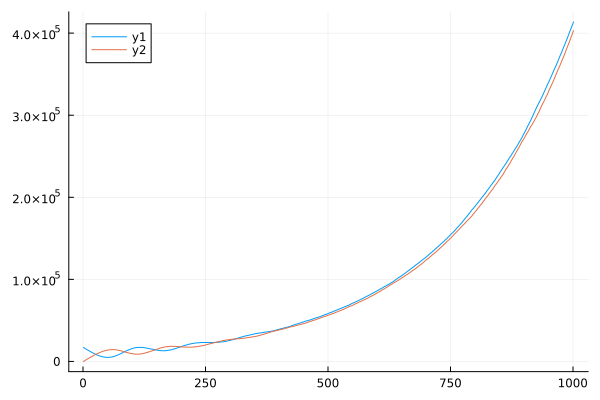

In [40]:
plot(1:1001, data.sum_type0)
plot!(1:1001, data.sum_type1)

In [166]:
layersniche2 = initialize_layersnichemodel!(17000, [(55, 20)], [(55, 20), (70, 20)], [(55, 20)], 1000, ms)
data2 = run!(layersniche2, agent_step!, model_step!, 1000; adata = [(type0, sum), (type1,sum), (type2, sum)])[1]

Row,step,sum_type0,sum_type1,sum_type2
,Int64,Int64,Int64,Int64
1,0,17000,0,0
2,1,16649,351,0
3,2,16268,732,0
4,3,15911,1089,0
5,4,15555,1445,0
6,5,15181,1820,0
7,6,14804,2197,0
8,7,14442,2559,0
9,8,14063,2940,0


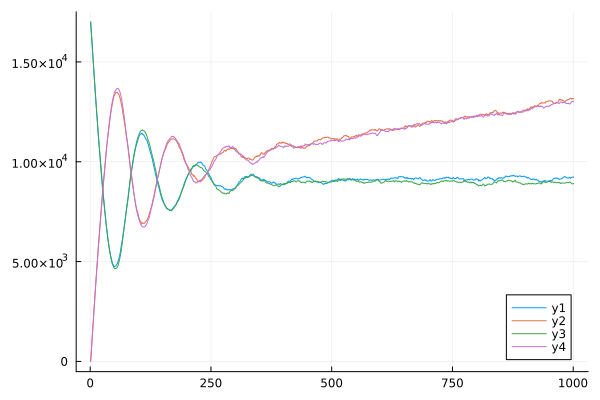

In [167]:
plot(1:1001, data.sum_type0)
plot!(1:1001, data.sum_type1)
plot!(1:1001, data2.sum_type0)
plot!(1:1001, data2.sum_type1)

In [15]:
layersniche2 = initialize_layersnichemodel!(17000, [(55, 20)], [(55, 20), (80, 20)], [(55, 20)], 1000, ms)
data3 = run!(layersniche2, agent_step!, model_step!, 1000; adata = [(type0, sum), (type1,sum), (type2, sum)])[1]

UndefVarError: UndefVarError: `initialize_layersnichemodel!` not defined

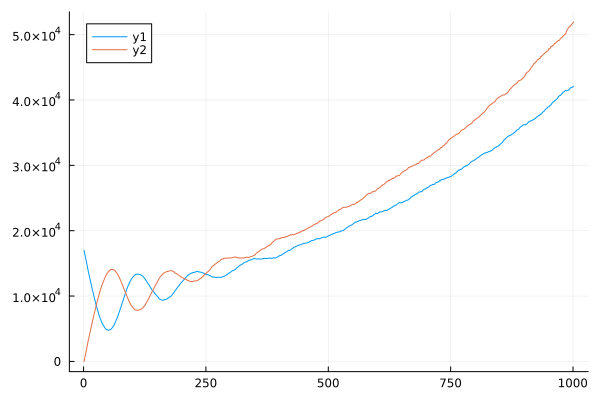

In [169]:
plot(1:1001, data3.sum_type0)
plot!(1:1001, data3.sum_type1)

In [190]:
data_sum_type0 = []
data_sum_type1 = []
data_sum_type2 = []
for time_differentiation in [55, 57, 60, 65, 67, 68, 69, 70, 80, 100]
    layersniche = initialize_layersnichemodel!(17000, [(55, 20)], [(55, 20), (time_differentiation, 20)], [(55, 20)], 1000, ms)
    data = run!(layersniche, agent_step!, model_step!, 1000; adata = [(type0, sum), (type1,sum), (type2, sum)])[1]
    push!(data_sum_type0, [data.sum_type0])
    push!(data_sum_type1, [data.sum_type1])
    push!(data_sum_type2, [data.sum_type2])
    print(time_differentiation)
end

555760656768697080100

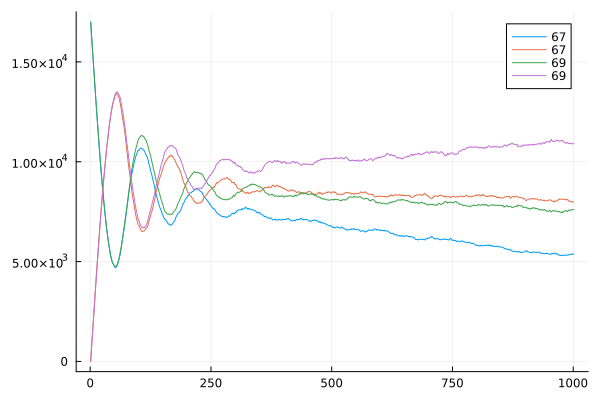

In [192]:
#plot(1:1001, data_sum_type0[1], label = "55")
#plot!(1:1001, data_sum_type1[1], label = "55")
#plot!(1:1001, data_sum_type0[2], label = "57")
#plot!(1:1001, data_sum_type1[2], label = "57")
#plot!(1:1001, data_sum_type0[3], label = "60")
#plot!(1:1001, data_sum_type1[3], label = "60")
#plot(1:1001, data_sum_type0[4], label = "65")
#plot!(1:1001, data_sum_type1[4], label = "65")
plot(1:1001, data_sum_type0[5], label = "67")
plot!(1:1001, data_sum_type1[5], label = "67")
#plot!(1:1001, data_sum_type0[6], label = "68")
#plot!(1:1001, data_sum_type1[6], label = "68")
plot!(1:1001, data_sum_type0[7], label = "69")
plot!(1:1001, data_sum_type1[7], label = "69")
#plot!(1:1001, data_sum_type0[8], label = "70")
#plot!(1:1001, data_sum_type1[8], label = "70")


In [222]:
data2_sum_type0 = []
data2_sum_type1 = []
data2_sum_type2 = []

time_differentiation = 60

for time_quiescence in [40, 45, 50, 55, 57, 60, 65, 67, 68, 69, 70]
    layersniche = initialize_layersnichemodel!(17000, [(55, 20)], [(55, 20), (time_differentiation, 20)], [(time_quiescence, 20)], 2000, ms)
    data = run!(layersniche, agent_step!, model_step!, 2000; adata = [(type0, sum), (type1,sum), (type2, sum)])[1]
    push!(data2_sum_type0, [data.sum_type0])
    push!(data2_sum_type1, [data.sum_type1])
    push!(data2_sum_type2, [data.sum_type2])
    print(time_quiescence)
end

4045505557606567686970

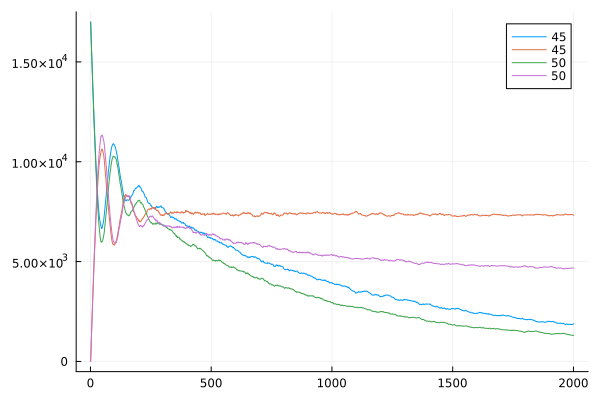

In [224]:
plot(1:2001, data2_sum_type0[1], label = "45")
plot!(1:2001, data2_sum_type1[1], label = "45")
plot!(1:2001, data2_sum_type0[2], label = "50")
plot!(1:2001, data2_sum_type1[2], label = "50")
#plot!(1:2001, data2_sum_type0[3], label = "55")
#plot!(1:2001, data2_sum_type1[3], label = "55")
#plot!(1:2001, data2_sum_type0[4], label = "57")
#plot!(1:2001, data2_sum_type1[4], label = "57")
#plot!(1:2001, data_sum_type0[5], label = "60")
#plot!(1:2001, data_sum_type1[5], label = "60")
#plot!(1:2001, data2_sum_type0[6], label = "68")
#plot!(1:2001, data2_sum_type1[6], label = "68")
#plot!(1:2001, data_sum_type0[7], label = "69")
#plot!(1:2001, data_sum_type1[7], label = "69")
#plot!(1:2001, data_sum_type0[8], label = "70")
#plot!(1:2001, data_sum_type1[8], label = "70")

In [35]:
data3_sum_type0 = []
data3_sum_type1 = []
data3_sum_type2 = []

time_differentiation =70
time_quiescence = 57

for time_division in [45, 50, 55, 57, 60, 65, 67, 68, 69, 70]
    layersniche = initialize_layersnichemodel!(17000, [(time_division, 20)], [(55, 20), (time_differentiation, 20)], [(time_quiescence, 20)], 1000, ms)
    data = run!(layersniche, agent_step!, model_step!, 1000; adata = [(type0, sum), (type1,sum), (type2, sum)])[1]
    push!(data3_sum_type0, [data.sum_type0])
    push!(data3_sum_type1, [data.sum_type1])
    push!(data3_sum_type2, [data.sum_type2])
    print(time_quiescence)
end

57575757575757575757

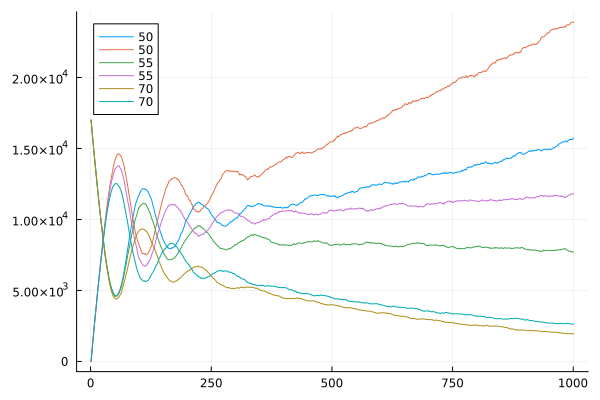

In [37]:
#plot(1:1001, data3_sum_type0[1], label = "45")
#plot!(1:1001, data3_sum_type1[1], label = "45")
plot(1:1001, data3_sum_type0[2], label = "50")
plot!(1:1001, data3_sum_type1[2], label = "50")
plot!(1:1001, data3_sum_type0[3], label = "55")
plot!(1:1001, data3_sum_type1[3], label = "55")
#plot!(1:1001, data3_sum_type0[4], label = "57")
#plot!(1:1001, data3_sum_type1[4], label = "57")
#plot(1:1001, data3_sum_type0[5], label = "67")
#plot!(1:1001, data3_sum_type1[5], label = "67")
#plot!(1:1001, data3_sum_type0[6], label = "68")
#plot!(1:1001, data3_sum_type1[6], label = "68")
#plot!(1:1001, data3_sum_type0[7], label = "69")
#plot!(1:1001, data3_sum_type1[7], label = "69")
plot!(1:1001, data3_sum_type0[10], label = "70")
plot!(1:1001, data3_sum_type1[10], label = "70")

In [30]:
data4_sum_type0 = []
data4_sum_type1 = []
data4_sum_type2 = []

time_differentiation =70
time_quiescence = 57
time_division = 55

for time_activation in [45, 50, 55, 57, 60, 65, 67, 68, 69, 70]
    layersniche = initialize_layersnichemodel!(17000, [(time_division, 20)], [(time_activation, 20), (time_differentiation, 20)], [(time_quiescence, 20)], 1000, ms)
    data = run!(layersniche, agent_step!, model_step!, 1000; adata = [(type0, sum), (type1,sum), (type2, sum)])[1]
    push!(data4_sum_type0, [data.sum_type0])
    push!(data4_sum_type1, [data.sum_type1])
    push!(data4_sum_type2, [data.sum_type2])
    print(time_quiescence)
end

57575757575757575757

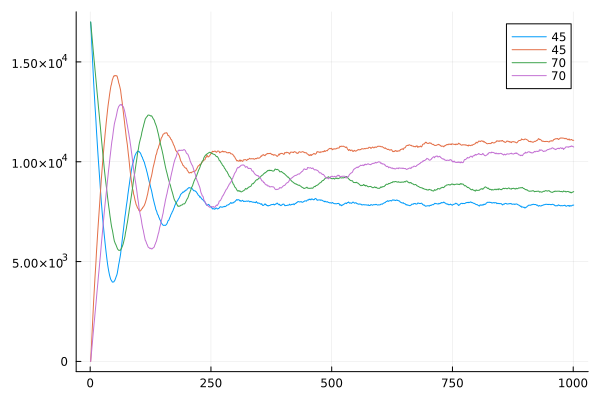

In [34]:
plot(1:1001, data4_sum_type0[1], label = "45")
plot!(1:1001, data4_sum_type1[1], label = "45")
#plot!(1:1001, data4_sum_type0[2], label = "50")
#plot!(1:1001, data4_sum_type1[2], label = "50")
#plot!(1:1001, data4_sum_type0[3], label = "55")
#plot!(1:1001, data4_sum_type1[3], label = "55")
#plot!(1:1001, data4_sum_type0[6], label = "65")
#plot!(1:1001, data4_sum_type1[6], label = "65")
plot!(1:1001, data4_sum_type0[10], label = "70")
plot!(1:1001, data4_sum_type1[10], label = "70")

When the number of cells in the not cycling state is at equilibrium, equal number of cell going in and gong out
=> control is over the number of cells which undergo division 

when there is a small number of cells in the niche, 

In [17]:
d = 0.001
r = 0.001
alpha = 0.0001
beta = 0.0009

p = ((r/d) - 1)/17000
phi = x -> 1/(1+p*x)
phi(17000)

1.0

In [18]:
data5_sum_type0 = []
data5_sum_type1 = []
data5_sum_type2 = []
ttt= 100000
time_differentiation = ttt*(d)
time_quiescence = ttt*(alpha)
time_division = ttt*(r)
time_activation = ttt*(beta)

layersniche = initialize_layersnichemodel!(17000, [(time_division, 20)], [(time_activation, 20), (time_differentiation, 20)], [(time_quiescence, 30)], 2000, ms)
data = run!(layersniche, agent_step!, model_step!, 2000; adata = [(type0, sum), (type1, sum), (type2, sum)], mdata = [])[1]
push!(data5_sum_type0, [data.sum_type0])
push!(data5_sum_type1, [data.sum_type1])
push!(data5_sum_type2, [data.sum_type2])
print(time_quiescence)

10.0

In [19]:
[time_differentiation, time_activation, time_division, time_quiescence]


4-element Vector{Float64}:
 100.0
  90.0
 100.0
  10.0

In [21]:
function estimate_probability(quiescence_distribution, division_distribution, differentiation_distribution, n_samples)
    probability = Dict()
    quiescence_first = 0
    differentiation_first = 0
    division_1 = 0
    division_2 = 0
    division_3 = 0


    for _ in 1:n_samples
        # Draw samples from both distributions
        quiescence_time = rand(quiescence_distribution)
        differentiation_time = rand(differentiation_distribution)
        division_times = [rand(division_distribution)]
        push!(division_times, division_times[1] + rand(division_distribution))
        push!(division_times, division_times[2] + rand(division_distribution))

        # Check if the cells returns to quiescence
        if (quiescence_time < division_times[1]) &  (quiescence_time < differentiation_time)
            quiescence_first += 1

        elseif (differentiation_time < division_times[1]) &  (differentiation_time < quiescence_time)
            differentiation_first += 1
        elseif (division_times[1] < differentiation_time) &  (division_times[1] < quiescence_time)
            division_1 += 1
            if (division_times[2] < differentiation_time) &  (division_times[2] < quiescence_time)
                division_2 += 1
                
                if (division_times[3] < differentiation_time) &  (division_times[3] < quiescence_time)
                    division_3 += 1
                end
            end
        end
        
    end

    # Estimate probability
    probability["quiescence"] = quiescence_first / n_samples
    probability["differentiation"] = differentiation_first / n_samples
    probability["1division"] = division_1 / n_samples
    probability["2division"] = division_2 / n_samples
    probability["3division"] = division_3 / n_samples
    return probability
end

# Parameters for the simulation
n_samples = 10000  # Number of samples to draw

# Estimate the probability
probability_estimate = estimate_probability(Normal(time_quiescence, 30), Normal(time_division, 30), Normal(time_differentiation, 30), n_samples)


Dict{Any, Any} with 5 entries:
  "quiescence"      => 0.9674
  "2division"       => 0.0
  "3division"       => 0.0
  "differentiation" => 0.0168
  "1division"       => 0.0158

In [61]:
parameter_exploration=[]
for time_quiescence in range(1,100)
    for time_division in range(1,100)
        for time_differentiation in range(1,100)
            probability_estimate = estimate_probability(Normal(time_quiescence, 30), Normal(time_division, 30), Normal(time_differentiation, 30), n_samples)
            push!(parameter_exploration, [(time_quiescence, time_division, time_differentiation), (probability_estimate["quiescence"], probability_estimate["differentiation"], probability_estimate["1division"], probability_estimate["2division"], probability_estimate["3division"])])
        end
    end
end   

In [75]:
using Plots
plotlyjs()

colors = cgrad(:viridis, 256)

scatter3d([parameter_exploration[x][1][1] for x in 1:1000000], [parameter_exploration[x][1][2] for x in 1:1000000], [parameter_exploration[x][1][3] for x in 1:1000000], marker_z=[parameter_exploration[x][2][1] for x in 1:1000000],color=:viridis, colorbar=true)

In [187]:
d = 0.001
r = 0.001
alpha = 0.0001
beta = 0.0006

data6_sum_type0 = []
data6_sum_type1 = []
data6_sum_type2 = []
ttt = 100000
time_differentiation = ttt*(d)
time_quiescence = ttt*(alpha)
time_division = ttt*(r)
time_activation = ttt*(beta)

layersniche = initialize_layersnichemodel!(17000, [(time_division, 20)], [(time_activation, 20), (time_differentiation, 20)], [(time_quiescence, 20)], 2000, ms)
data = run!(layersniche, agent_step!, model_step!, 2000; adata = [(type0, sum), (type1, sum), (type2, sum)])[1]
push!(data6_sum_type0, [data.sum_type0])
push!(data6_sum_type1, [data.sum_type1])
push!(data6_sum_type2, [data.sum_type2])
print(time_quiescence)

10.0

In [188]:
[time_differentiation, time_quiescence, time_division, time_activation]

4-element Vector{Float64}:
 100.0
  10.0
 100.0
  59.99999999999999

In [98]:
numbers = draw_quiescence_time(layersniche, 1000)
numbers1 = draw_activation_time(layersniche, 1000)
numbers2 =  draw_division_time(layersniche, 1000)
numbers3 = draw_differentiation_time(layersniche, 1000)
histogram(numbers, bins=20, xlabel="Value", ylabel="Frequency", label="quiescence time", title="Histogram of Time distribution")
histogram!(numbers1, bins=20, label="acivation time")
histogram!(numbers2, bins=20, label="division time")
histogram!(numbers3, bins=20, label="differetiation time")
savefig("hist_dist.png")

"/home/ajaeger/Documents/githubrepos/Stage/Script/hist_dist.png"

In [122]:
data7_sum_type0 = []
data7_sum_type1 = []
data7_sum_type2 = []
ttt = 100000
time_differentiation = ttt*(d)
time_quiescence = ttt*(alpha)
time_division = ttt*(r)
time_activation = ttt*(beta)

layersniche = initialize_layersnichemodel!(17000, [(time_division, 20)], [(time_activation, 20), (time_differentiation, 20)], [(time_quiescence, 20)], 20000, ms)
data = run!(layersniche, agent_step!, model_step!, 20000; adata = [(type0, sum), (type1, sum), (type2, sum)])[1]
push!(data7_sum_type0, [data.sum_type0])
push!(data7_sum_type1, [data.sum_type1])
push!(data7_sum_type2, [data.sum_type2])
print(time_quiescence)

In [40]:
numbers = draw_quiescence_time(layersniche, 100000)
numbers1 = draw_activation_time(layersniche, 100000)
numbers2 =  draw_division_time(layersniche, 100000)
numbers3 = draw_differentiation_time(layersniche, 1000)
histogram(numbers, bins=20, xlabel="Time(in days)", ylabel="Frequency", label="quiescence time", title="Histogram of Time distribution")
histogram!(numbers1, bins=20, label="acivation time")
histogram!(numbers2, bins=20, label="division time")
histogram!(numbers3, bins=20, label="differetiation time")
#vline!([median(numbers)], linewidth=3, label = "median", ls=:dash)
#vline!([mean(numbers)], linewidth=3, label = "mean", ls=:dot)
savefig("histo_dist.png")

"/home/ajaeger/Documents/githubrepos/Stage/Script/histo_dist.png"

In [146]:
numbers = draw_quiescence_time(layersniche, 1000)
numbers1 = draw_activation_time(layersniche, 1000)
numbers2 =  draw_division_time(layersniche, 1000)
numbers3 = draw_differentiation_time(layersniche, 1000)
histogram(numbers, bins=20, xlabel="Value", ylabel="Frequency", label="quiescence time", title="Histogram of Time distribution")
histogram!(numbers1, bins=20, label="acivation time")
histogram!(numbers2, bins=20, label="division time")
histogram!(numbers3, bins=20, label="differetiation time")
savefig("histo_dist3.png")

"/home/ajaeger/Documents/githubrepos/Stage/Script/histo_dist3.png"

In [195]:
numbers = draw_quiescence_time(layersniche, 1000)
numbers1 = draw_activation_time(layersniche, 1000)
numbers2 =  draw_division_time(layersniche, 1000)
numbers3 = draw_differentiation_time(layersniche, 1000)
histogram(numbers, bins=20, xlabel="Value", ylabel="Frequency", label="quiescence time", title="Histogram of Time distribution")
histogram!(numbers1, bins=20, label="acivation time")
histogram!(numbers2, bins=20, label="division time")
histogram!(numbers3, bins=20, label="differetiation time")
savefig("histo_dist6.png")

"/home/ajaeger/Documents/githubrepos/Stage/Script/histo_dist6.png"

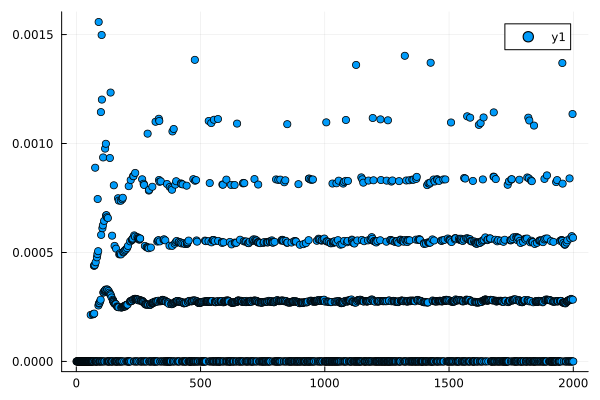

In [166]:
plot(1:2000, layersniche.cell_created./(layersniche.stem_cell_number[2]), seriestype =:scatter)

In [167]:
mean(layersniche.cell_created./(layersniche.stem_cell_number[2]))

0.0002566194483956351

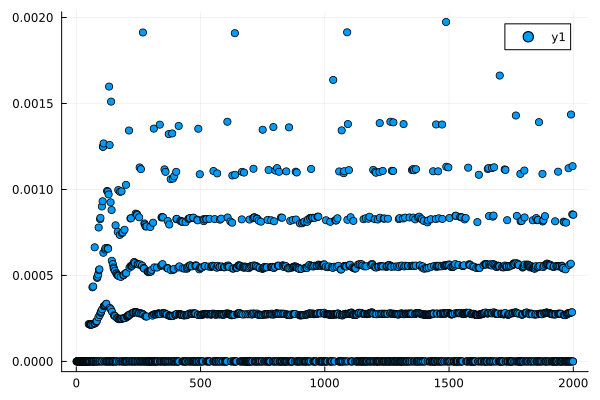

In [169]:
plot(1:2000, layersniche.cell_differentiated./(layersniche.stem_cell_number[2]), seriestype =:scatter)

In [170]:
mean(layersniche.cell_differentiated./(layersniche.stem_cell_number[2]))

0.0003173923715191822

In [64]:
length(data5_sum_type0)

2

In [53]:
[data5_sum_type0[1, x] for x in 1:450]

BoundsError: BoundsError: attempt to access 1-element Vector{Any} at index [1, 2]

In [193]:
layersniche = initialize_layersnichemodel!(17000, [(time_division, 20)], [(time_activation, 20), (time_differentiation, 20)], [(time_quiescence, 20)], 2000, ms)
data = run!(layersniche, agent_step!, model_step!, 2000; adata = [(type0, sum), (type1, sum), (type2, sum)])[1]
push!(data6_sum_type0, [data.sum_type0])
push!(data6_sum_type1, [data.sum_type1])
push!(data6_sum_type2, [data.sum_type2])

5-element Vector{Any}:
 [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  331, 331, 331, 331, 331, 331, 332, 332, 332, 332]]
 [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  341, 341, 341, 341, 341, 341, 341, 341, 341, 341]]
 [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  328, 329, 329, 329, 329, 329, 329, 330, 330, 331]]
 [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  336, 336, 336, 337, 337, 337, 337, 337, 337, 337]]
 [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  346, 346, 346, 346, 346, 346, 346, 346, 346, 346]]

In [79]:
mean.([data5_sum_type0[x][1][1:450] for x in 1:10])

10-element Vector{Float64}:
 13315.626666666667
 13322.426666666666
 13317.38
 13331.693333333333
 13314.286666666667
 13309.81111111111
 13304.062222222223
 13319.697777777777
 13308.468888888889
 13310.34

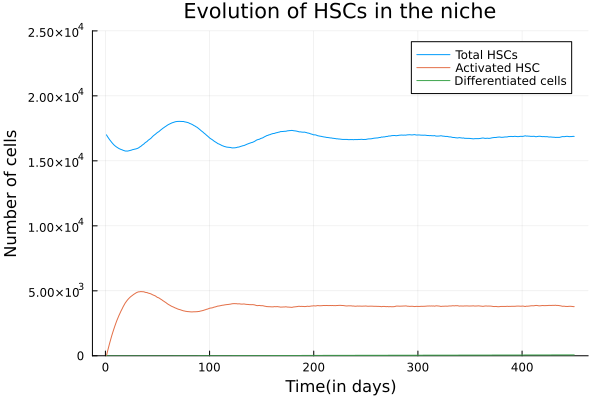

In [197]:
plot(1:450, mean([data6_sum_type0[x][1][1:450] for x in 1:5]) + mean([data5_sum_type1[x][1][1:450] for x in 1:10]) , label = "Total HSCs", title = "Evolution of HSCs in the niche", xlabel="Time(in days)", ylabel="Number of cells", show = true)
plot!(1:450, mean([data6_sum_type1[x][1][1:450] for x in 1:5]) , label = "Activated HSC")
plot!(1:450, mean([data6_sum_type2[x][1][1:450] for x in 1:5]) , label = "Differentiated cells")
ylims!(0,25000)

In [198]:
lr = linregress(1:450, mean([data6_sum_type2[x][1][1:450] for x in 1:5]))


LinearRegression.LinearRegressor{Vector{Float64}}(true, [0.1654763068788817, -4.9233516456322715])

We see that when d = r < beta then the number of stem cells decrease (the division times and differentiation times are inferior to activation andquiescence time too much cell leave the niche to maintain it).
If the replication time (r) is inferior to the differentiation time then the number of stem cells 0 increase, same for the number of stem cell 1. (so abehavior needed if the niche is not at carrying capacity).


On veut regarder le temps moyens des divisions des cellules qui effectivement se divisent par rapport aux temps moyens de division de toutes les cellules. On veut aussi regarder le nombre de divisions effectives de cellules qui se divisent, qui se differencient, qui s'activent et qui se desactive.

On veut aussi voir le taux de cellules souches créées (nombre de cellules crées sur nombre de cellules, pareille pour le taux d'activation, taux de quiescence et taux de differentiation).



In [ ]:
set_parameter_1 = Dict()

In [13]:
for i in 1:10
    niche = initialize_model!(1000, (log(2)/(1/110), 15) , (log(2)/(1/110), 15) , ms)
    data = run!(niche, agent_step!, model_step!, 1000; adata = [(labeled, sum), (type0, sum), (type1, sum)])
    set_parameter_1[string(i)] = data[1]
end

MethodError: MethodError: no method matching initialize_model!(::Int64, ::Tuple{Float64, Int64}, ::Tuple{Float64, Int64}, ::typeof(ms))

Closest candidates are:
  initialize_model!(::Int64, ::Tuple, ::Tuple, !Matched::Int64, !Matched::Any)
   @ Main ~/Documents/githubrepos/Stage/Script/stem_cell_notebook.ipynb:1


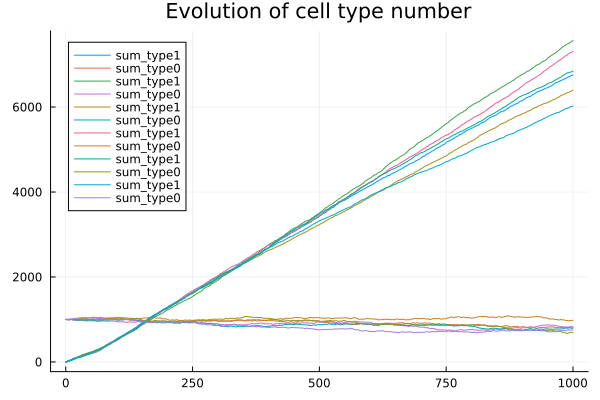

In [169]:
using Plots
#plot(0:1000,data[1][!,:mean_division_time], label = "mean_division_time", title = "Evolution of cell type number")
plot(0:1000,set_parameter_1["3"][!,:sum_type1], label = "sum_type1", title = "Evolution of cell type number")
plot!(0:1000,set_parameter_1["3"][!,:sum_type0], label = "sum_type0")
plot!(0:1000,set_parameter_1["4"][!,:sum_type1], label = "sum_type1")
plot!(0:1000,set_parameter_1["5"][!,:sum_type0], label = "sum_type0")
plot!(0:1000,set_parameter_1["6"][!,:sum_type1], label = "sum_type1")
plot!(0:1000,set_parameter_1["6"][!,:sum_type0], label = "sum_type0")
plot!(0:1000,set_parameter_1["7"][!,:sum_type1], label = "sum_type1")
plot!(0:1000,set_parameter_1["7"][!,:sum_type0], label = "sum_type0")
plot!(0:1000,set_parameter_1["8"][!,:sum_type1], label = "sum_type1")
plot!(0:1000,set_parameter_1["8"][!,:sum_type0], label = "sum_type0")
plot!(0:1000,set_parameter_1["9"][!,:sum_type1], label = "sum_type1")
plot!(0:1000,set_parameter_1["9"][!,:sum_type0], label = "sum_type0")


In [171]:
set_parameter_2 = Dict()

Dict{Any, Any}()

In [183]:
for i in 4:6
    niche = initialize_model!(1000, (log(2)/(1/110), 15) , (log(2)/(1/110), 15) , ms)
    data = run!(niche, agent_step!, model_step!, 5000; adata = [(type0, sum), (type1, sum)])
    set_parameter_2[string(i)] = data[1]
end

In [68]:
#plot(0:5000,set_parameter_2["1"][!,:sum_type1], label = "sum_type1", title = "Evolution of cell type number")
plot(0:5000,set_parameter_2["1"][!,:sum_type1], label = "1")
#plot!(0:5000,set_parameter_2["2"][!,:sum_type1], label = "sum_type1")
plot!(0:5000,set_parameter_2["2"][!,:sum_type0], label = "2")
#plot!(0:5000,set_parameter_2["3"][!,:sum_type1], label = "sum_type1")
plot!(0:5000,set_parameter_2["3"][!,:sum_type0], label = "3")
plot!(0:5000,set_parameter_2["4"][!,:sum_type0], label = "4")
plot!(0:5000,set_parameter_2["5"][!,:sum_type0], label = "5")

UndefVarError: UndefVarError: `set_parameter_2` not defined

In [49]:
set_parameter_3 = Dict()

Dict{Any, Any}()

In [54]:
for i in 1:10
    niche = initialize_model!(1000, (log(2)/(1/110), 15) , (log(2)/(1/110), 15) , ms)
    data = run!(niche, agent_step!, model_step!, 300; adata = [(type0, sum), (type1, sum)])
    set_parameter_3[string(i)] = data[1]
end

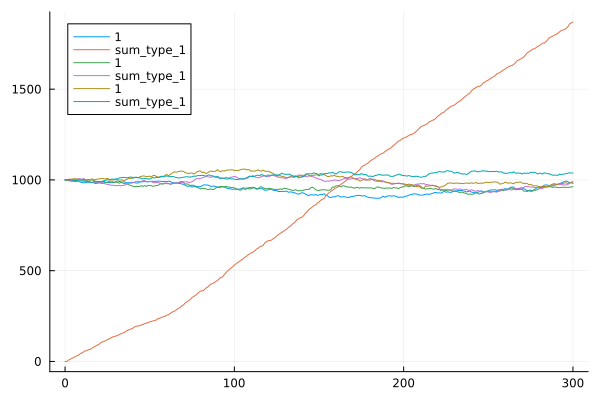

In [57]:
using Plots

plot(0:300,set_parameter_3["1"][!,:sum_type0], label = "1")
plot!(0:300,set_parameter_3["1"][!,:sum_type1], label = "sum_type_1", show = true)
plot!(0:300,set_parameter_3["2"][!,:sum_type0], label = "1")
plot!(0:300,set_parameter_3["3"][!,:sum_type0], label = "sum_type_1", show = true)
plot!(0:300,set_parameter_3["4"][!,:sum_type0], label = "1")
plot!(0:300,set_parameter_3["5"][!,:sum_type0], label = "sum_type_1", show = true)

In [66]:
set_parameter_4 = Dict()
for i in 1:10
    niche = initialize_model!(1000, (log(2)/(1/110), 15) , (110, 15) , ms)
    data = run!(niche, agent_step!, model_step!, 300; adata = [(type0, sum), (type1, sum)])
    set_parameter_4[string(i)] = data[1]
end

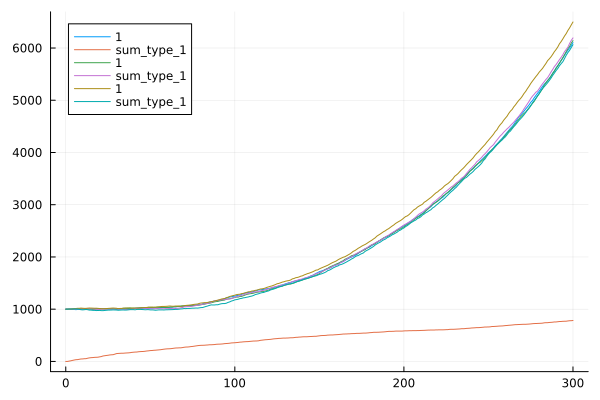

In [67]:
using Plots

plot(0:300,set_parameter_4["1"][!,:sum_type0], label = "1")
plot!(0:300,set_parameter_4["1"][!,:sum_type1], label = "sum_type_1", show = true)
plot!(0:300,set_parameter_4["2"][!,:sum_type0], label = "1")
plot!(0:300,set_parameter_4["3"][!,:sum_type0], label = "sum_type_1", show = true)
plot!(0:300,set_parameter_4["4"][!,:sum_type0], label = "1")
plot!(0:300,set_parameter_4["5"][!,:sum_type0], label = "sum_type_1", show = true)

if the probability to divide is not equal to the probability to differentiate, => exponential growth or linear decrease of the number of stem cells => unstable equilibrium.

ideally a niche model would present a stable equilibrium reach we expect hematopoeisis to be a robust process as it is esential for survival and any long term disruption of the niche would lead to severe disease or death of the individual. 

Here we observe that the time to doubling being equal to the time to the time to the time to differentiation.
In this case the time to differentiation is not inherited from the mother cell to the daughter cell, the time to differentiation is defined as the mean time between at whih a cell will activation from its birth through mitosis.
division is therefor a reset event.
So in this case for stem cell we can assume that in the "stem" state all cells are identical and sister cells are not more related than cousins cells for instance. No inheritance of property for cells in the niche. 
Not actually true because it has been shown that there is differences and competitions between the clones. So the existence of a relatively steady number of stem cells in the bone marrow is is most probably du to physical constrain of the niche. Niches are not infinite => given number of possible stem cells for a given number of niche, cells which leave the niche loose their stem cell state.

1 Hematopoeisis and the niche:
- First explain what hematopoeisis is (simple definition.)
- explain what stem cells are (ability to self renew to differentiate, that they are  "immortal", not numerous where they are found)
- explain what a niche is (when where they discovered, what we know and don't know about them briefly, (fixed number, how they maintain the stems state (chemical signal ,...)))
- why is it important to understand their behavior (case of cancer, AML, transplantation talk about the work of the group at unimelb)
- give number of how impressive the hematopoeisis regulation is (number of cell created per day)
- remind how har it is to study stem cell an dcharacterize them => hence the need to model to try to interpret the data, new sources of data in the recent years to study transition, like labelling, transcript => alow to reconstruct lineage
- already niche model and hematopoeisis model, but they are population based, and 

Regulation of the cells in the niche 
- different model of the niche, ( not included in the paper where i get my information from), such a model => exponential growth ( similar to the M2 model in adam mac lean ), but this model if there is no space "constraint", does not for competition => model considering competition between cells of different fitness (normal cells vs stem cells), managed to fit pathological data in of cancer evolution dynamic 

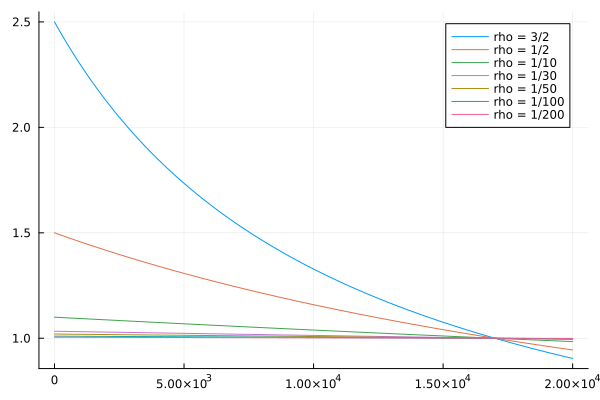

In [11]:
using Plots

K = 17000   #Carrying capacity
delta = 0.1
phi = x -> (rho + 1)*K/(K+(rho*x))

rho = 3/2
plot(0:20000, phi.(0:20000), label = "rho = 3/2")
rho = 1/2 #growth rate 
plot!(0:20000, phi.(0:20000), label = "rho = 1/2")
rho = 1/10
plot!(0:20000, phi.(0:20000), label = "rho = 1/10")
rho = 1/30
plot!(0:20000, phi.(0:20000), label = "rho = 1/30")
rho = 1/50
plot!(0:20000, phi.(0:20000), label = "rho = 1/50")
rho = 1/100
plot!(0:20000, phi.(0:20000), label = "rho = 1/100")
rho = 1/200
plot!(0:20000, phi.(0:20000), label = "rho = 1/200")

In [29]:
#Adam mac Lean M3 model 2014 Paper

#rho = 1/110 #growth rate 
#K = 17000   #Carrying capacity
#delta = 0.1 # "death rate" actually its more a rate of "leaving the stem cell state wether through death or differentiation 
#phi = x, rho, K -> (rho + 1)*K/(K+(rho*x))
#function phi(rho, K, x)
 #   return (rho + 1)*K/(K+(rho*x))
#end
#p = [rho, K, delta]
#u = [x0, x1, y0, y1] with y the labelled population and x the already established population
function log_growth(du,u,p,t) 
    du[1] = ((p[1] + 1)*p[2]/(p[2]+(p[1]*(u[1] + u[3]))) - 1)*p[3]*u[1]
    du[2] = p[3]*u[1]
    du[3] = ((p[1] + 1)*p[2]/(p[2]+(p[1]*(u[1] + u[3]))) - 1)*p[3]*u[3]
    du[4] = p[3]*u[3] #label frequency 
end

log_growth (generic function with 1 method)

In [30]:
#Lets consider the numbers in Fundamental properties of unperturbed haematopoiesis from stem cells in vivo
#In 28 weeks 30% of HSC gave progeny (0.00153 got activated per day let's say )
sol_for_deltas = Dict()
delta = 0.000153
for rho in [0.009, 0.001, 0.01, 0.1, 2.0]
    prob = ODEProblem(log_growth, [1530.0; 0.0; 170.0; 0.0], (0.0, 450.0), (rho, 17000, delta))
    sol = solve(prob, alg = Rodas4P)
    sol_for_deltas[string(rho)] = sol
end

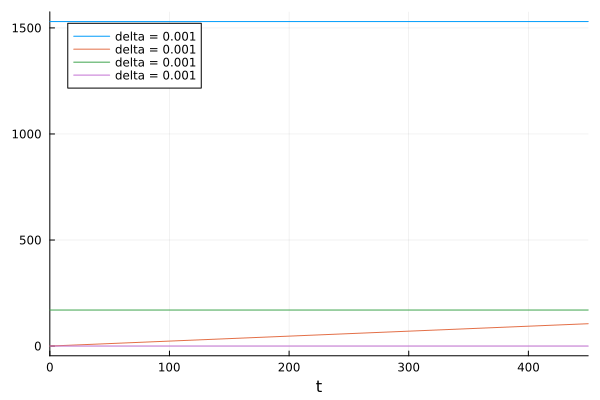

In [31]:

plot(sol_for_deltas["0.001"] , label = "delta = 0.001", show = true)
#plot!(sol_for_deltas["0.01"] , label = "delta = 0.01", show = true)
#plot!(sol_for_deltas["0.1"] , label = "delta = 0.1", show = true)
#it seems that nothing is happening but now lets simulate the labelling od 1% of HSC 

In [8]:
sol_for_deltas["0.009"]
#We see that as expected the value has no influence on the behavior of cell population. Indeed as we see on the plot of phi no matter the value of rho, phi =1 for x = 1700 (the equilibrium)
#only delta will influence the number of cells wich differentiates into something else for instance ST-HSC
#From the function of unperturbed ... no cells appear in another compartment before 4 weeks 
#we try to evaluate to which parameters this would amount 
#if we condsider Beta = delta in the M3 model then we can set delta = 0.009 which is coherent with the observation in "function of ..." let's consider then than delta is within the confidence interval 
#of Beta which is [0.006, 0.012]

function std_dev_from_confidence_interval(mean, confidence_interval)
    width = confidence_interval[2] - confidence_interval[1]
    z_value = 1.96  # For 95% confidence interval
    std_dev = width / (2 * z_value)
    return std_dev
end

# Example usage
mean_value = 0.009
confidence_interval = [0.006, 0.012]  # Example interval
std_dev = std_dev_from_confidence_interval(mean_value, confidence_interval)
println("Standard deviation: ", std_dev)



Standard deviation: 0.0015306122448979593


For the distribution needed in the ABM we want the distribution of the first event of division, we are going to say that it follows an inverse Gaussian distribution. 

mu =111.11111111111111 lambda =5.859891975235396e11


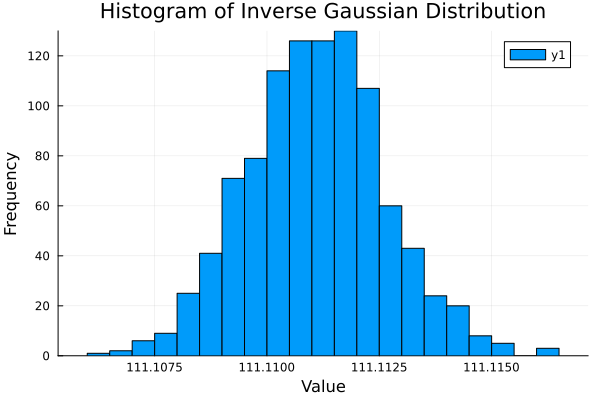

In [16]:
using SpecialFunctions, Distributions

function find_inverse_gaussian_parameters(mu, sigma)
    lambda = 1 / sigma^2
    mu_ig = 1 / mu
    lambda_ig = lambda / (mu^3)
    return mu_ig, lambda_ig
end

# Example usage
mu = 0.009  # Mean of the normal distribution
sigma = 0.00153  # Standard deviation of the normal distribution

# Find parameters for the inverse Gaussian distribution
mu_ig, lambda_ig = find_inverse_gaussian_parameters(mu, sigma)

# Calculate the PDF of the inverse Gaussian distribution at a specific point
samples = rand(InverseGaussian(mu_ig, lambda_ig), 1000)
println("mu =", mu_ig, " lambda =", lambda_ig)
histogram(samples, bins=20, xlabel="Value", ylabel="Frequency", title="Histogram of Inverse Gaussian Distribution")

This is the estimated distribution of the time to 

In [ ]:
function growth_x0(du, u, p, t) #we look at the growth of x0 for K, rho and delta fixed
    du[1] = ((0.009 + 1)*17000/(17000+(*(u[1] + u[3]))) - 1)*p[3]*u[1]
end 

In [3]:
function N(N0, K, rho, t)
    return K/(1 + ((K - N0)/N0)*exp(-rho*t))
end

N (generic function with 1 method)

In [8]:
rho = 0.009
K = 17000
Nt_for_N0 = Dict()
doubling_time = Dict()
t = 1:10000
for N0 in 1:17000
    Nt_for_N0[string(N0)] = N.(N0, K, rho, t)
    times = [(1, N0)]
    for doubling_size in range(start = 2*N0, stop = 17000, step = N0)
        time_doubling = findfirst(x -> x>=doubling_size, Nt_for_N0[string(N0)])
        if t != nothing
            push!(times, (time_doubling, doubling_size))
        end
    end
    doubling_time[string(N0)] = times
end
#Nt_for_N0["170"][450]

In [45]:
doubling_time["1"]
#Nt_for_N0["2"]

17000-element Vector{Tuple{Int64, Int64}}:
 (1, 1)
 (78, 2)
 (123, 3)
 (155, 4)
 (179, 5)
 (200, 6)
 (217, 7)
 (232, 8)
 (245, 9)
 (256, 10)
 ⋮
 (1934, 16992)
 (1949, 16993)
 (1966, 16994)
 (1986, 16995)
 (2011, 16996)
 (2043, 16997)
 (2088, 16998)
 (2165, 16999)
 (5165, 17000)

In [53]:
function get_doubling_time(data::Vector{Tuple{Int64, Int64}}, N0::Int)
    doubling_size = 2*data[2][2]
    doubling_time = [data[2][1] - data[1][1]]
    doubling_size_record = [data[2][2]]
    index = 3
    last_doubling_time = data[2][1]
    while doubling_size < 17000
        if data[index][2] == doubling_size
            push!(doubling_size_record, doubling_size)
            push!(doubling_time, data[index][1] - last_doubling_time)
            last_doubling_time = data[index][1]
            doubling_size = 2*data[index][2]
        end
        index += 1
    end
    return doubling_time, doubling_size_record
end

get_doubling_time (generic function with 2 methods)

In [55]:
function get_doubling_time_2(data::Vector{Tuple{Int64, Int64}}, start::Int)
    doubling_size = start
    doubling_time = []
    doubling_size_record = []
    index = 1
    last_doubling_time = data[2][1]
    while doubling_size < 17000
        if data[index][2] == doubling_size
            push!(doubling_size_record, doubling_size)
            push!(doubling_time, data[index][1] - last_doubling_time)
            last_doubling_time = data[index][1]
            doubling_size = 2*data[index][2]
        end
        index += 1
    end
    return doubling_time[2:length(doubling_time)], doubling_size_record[2:length(doubling_size_record)]
end

get_doubling_time_2 (generic function with 1 method)

In [59]:
get_doubling_time_2(doubling_time["1"], 7)

(Any[77, 77, 77, 78, 77, 79, 80, 83, 91, 112, 222], Any[14, 28, 56, 112, 224, 448, 896, 1792, 3584, 7168, 14336])

In [58]:
get_doubling_time(doubling_time["1792"], 1792)

([90, 112, 222], [3584, 7168, 14336])

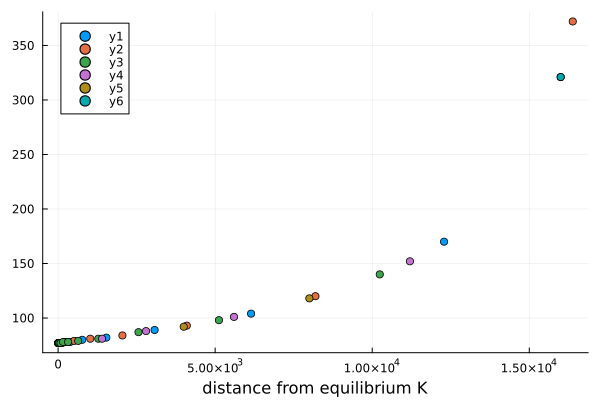

In [60]:
plot(get_doubling_time(doubling_time["3"], 3)[2], get_doubling_time(doubling_time["3"], 3)[1], seriestype=:scatter, xlabel = "Doubling size")
plot!(get_doubling_time(doubling_time["1"], 1)[2], get_doubling_time(doubling_time["1"], 1)[1], seriestype=:scatter)
plot!(get_doubling_time(doubling_time["5"], 5)[2], get_doubling_time(doubling_time["5"], 5)[1], seriestype=:scatter)
plot!(get_doubling_time(doubling_time["700"], 700)[2], get_doubling_time(doubling_time["700"], 700)[1], seriestype=:scatter)
plot!(get_doubling_time(doubling_time["2000"], 2000)[2], get_doubling_time(doubling_time["2000"], 2000)[1], seriestype=:scatter)
plot!(get_doubling_time(doubling_time["8000"], 8000)[2], get_doubling_time(doubling_time["8000"], 8000)[1], seriestype=:scatter)

We are going to try with the ABM now. Lets' initialize an homogenous population of stem cells, for a niche at the equilibrium.

We are going to draw for each cells in the niche a time to division then we are going to draw a random number between 0 and this number to know where the cell is in the division process, thus the time to division is the first number minus the second one. We repeat the process for activation. 